In [ ]:
# Import the required libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Q1. Display a few of the tissue images from the training and test datasets.

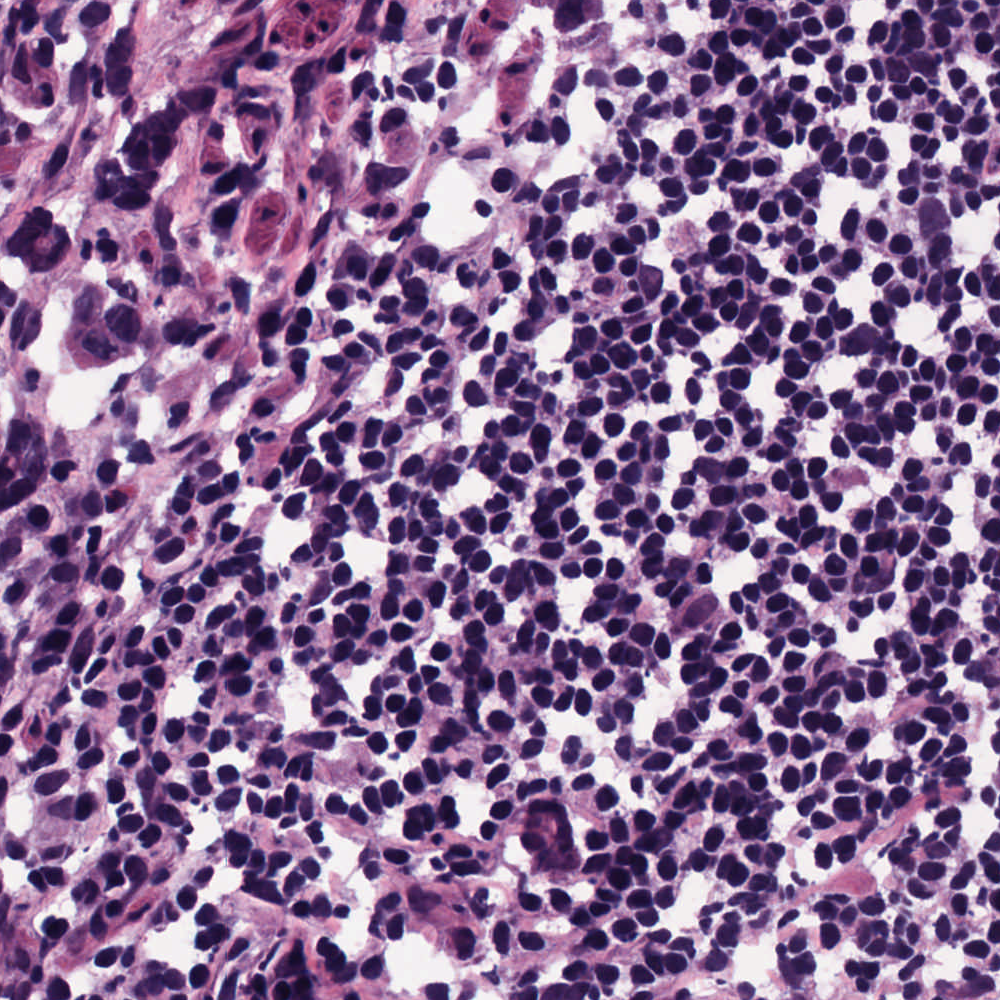

In [ ]:
img1 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Training-Data/Tissue-Images/TCGA-RD-A8N9-01A-01-TS1.png')
cv2_imshow(img1)

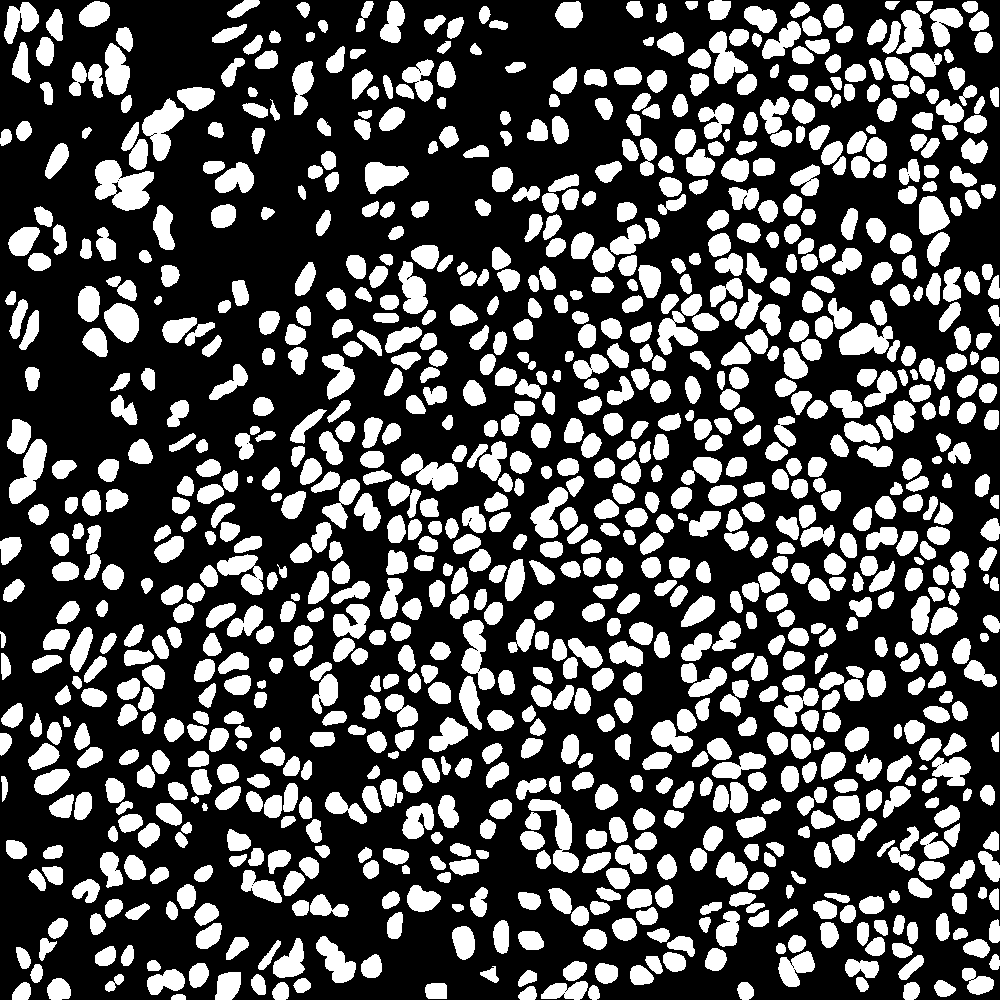

In [ ]:
mask1 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Training-Data/Binary-Mask/TCGA-RD-A8N9-01A-01-TS1.png')
cv2_imshow(mask1)

**Displaying few training images and their masks**

In [ ]:
img2 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Training-Data/Tissue-Images/TCGA-18-5592-01Z-00-DX1.png')
img3 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Training-Data/Tissue-Images/TCGA-A7-A13F-01Z-00-DX1.png')
mask2 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Training-Data/Binary-Mask/TCGA-18-5592-01Z-00-DX1.png')
mask3 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Training-Data/Binary-Mask/TCGA-A7-A13F-01Z-00-DX1.png')

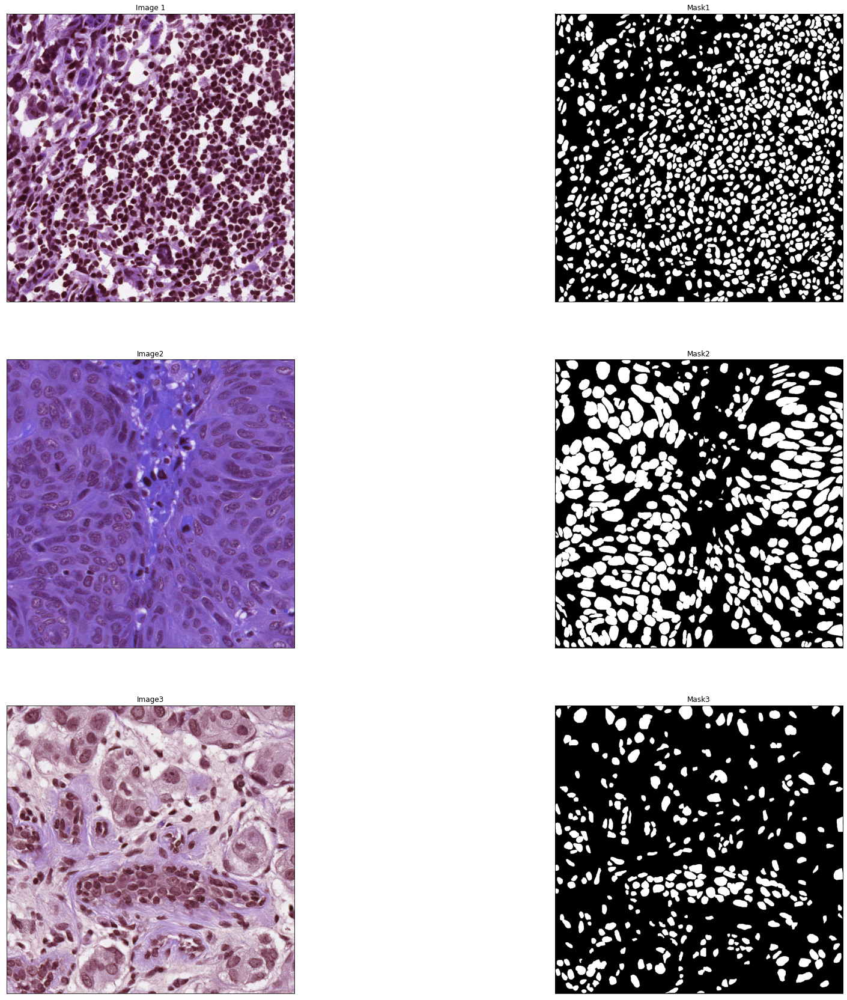

In [ ]:
fig = plt.figure()

fig.set_figwidth(30)
fig.set_figheight(30)

plt.subplot(321),plt.imshow(img1)
plt.title('Image 1'), plt.xticks([]), plt.yticks([])
plt.subplot(322),plt.imshow(mask1)
plt.title('Mask1'), plt.xticks([]), plt.yticks([])
plt.subplot(323),plt.imshow(img2)
plt.title('Image2'), plt.xticks([]), plt.yticks([])

plt.subplot(324),plt.imshow(mask2)
plt.title('Mask2'), plt.xticks([]), plt.yticks([])
plt.subplot(325),plt.imshow(img3)
plt.title('Image3'), plt.xticks([]), plt.yticks([])
plt.subplot(326),plt.imshow(mask3)
plt.title('Mask3'), plt.xticks([]), plt.yticks([])

plt.axis('on')
plt.show()

**Displaying few testing images and their masks**

In [ ]:
img_1 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Test-Data/Tissue-Images/TCGA-2Z-A9J9-01A-01-TS1.png')
img_2 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Test-Data/Tissue-Images/TCGA-AC-A2FO-01A-01-TS1.png')
img_3 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Test-Data/Tissue-Images/TCGA-HT-8564-01Z-00-DX1.png')
mask_1 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Test-Data/Binary-Mask/TCGA-2Z-A9J9-01A-01-TS1.png')
mask_2 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Test-Data/Binary-Mask/TCGA-AC-A2FO-01A-01-TS1.png')
mask_3 = cv2.imread('/content/drive/MyDrive/MoNuSeg-Test-Data/Binary-Mask/TCGA-HT-8564-01Z-00-DX1.png')

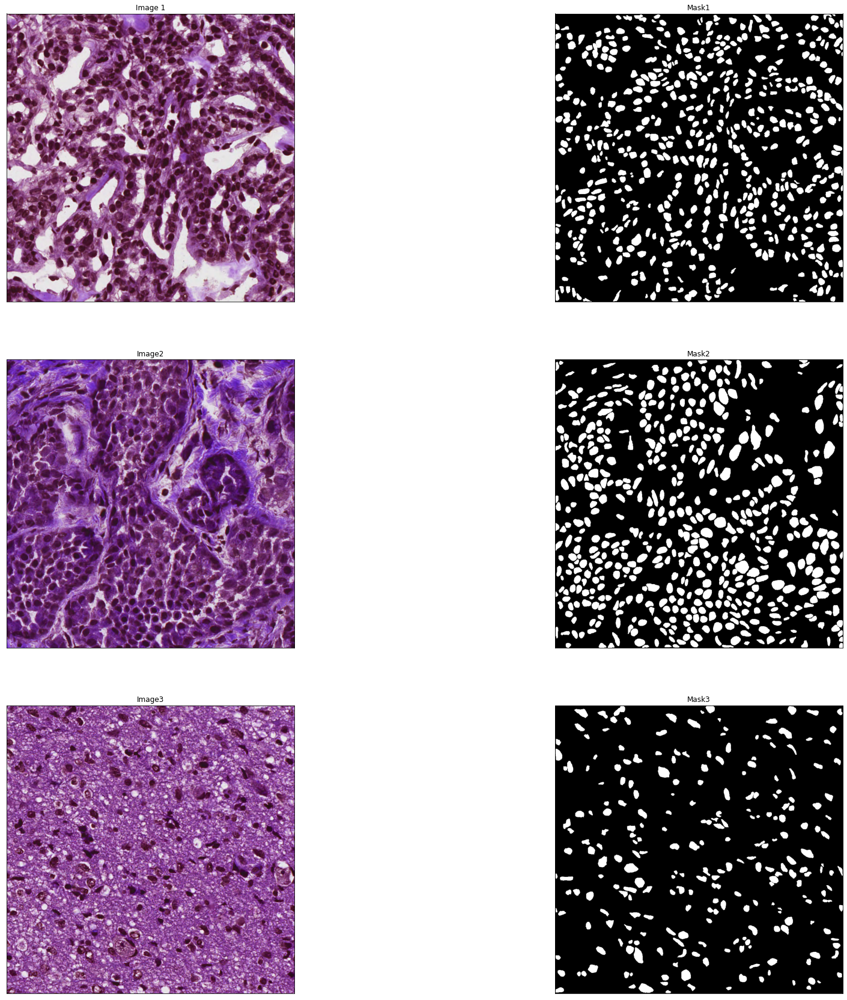

In [ ]:
fig = plt.figure()

fig.set_figwidth(30)
fig.set_figheight(30)

plt.subplot(321),plt.imshow(img_1)
plt.title('Image 1'), plt.xticks([]), plt.yticks([])
plt.subplot(322),plt.imshow(mask_1)
plt.title('Mask1'), plt.xticks([]), plt.yticks([])
plt.subplot(323),plt.imshow(img_2)
plt.title('Image2'), plt.xticks([]), plt.yticks([])

plt.subplot(324),plt.imshow(mask_2)
plt.title('Mask2'), plt.xticks([]), plt.yticks([])
plt.subplot(325),plt.imshow(img_3)
plt.title('Image3'), plt.xticks([]), plt.yticks([])
plt.subplot(326),plt.imshow(mask_3)
plt.title('Mask3'), plt.xticks([]), plt.yticks([])

plt.axis('on')
plt.show()

In [ ]:
import os # Using this library to access the images from the folders and create a list of training and testing images to be used for training
os.listdir('/content/drive/MyDrive/MoNuSeg-Training-Data/Tissue-Images')
os.listdir('/content/drive/MyDrive/MoNuSeg-Training-Data/Binary-Mask')


['TCGA-18-5592-01Z-00-DX1.png',
 'TCGA-21-5784-01Z-00-DX1.png',
 'TCGA-21-5786-01Z-00-DX1.png',
 'TCGA-38-6178-01Z-00-DX1.png',
 'TCGA-49-4488-01Z-00-DX1.png',
 'TCGA-50-5931-01Z-00-DX1.png',
 'TCGA-A7-A13E-01Z-00-DX1.png',
 'TCGA-A7-A13F-01Z-00-DX1.png',
 'TCGA-AR-A1AK-01Z-00-DX1.png',
 'TCGA-AR-A1AS-01Z-00-DX1.png',
 'TCGA-AY-A8YK-01A-01-TS1.png',
 'TCGA-B0-5698-01Z-00-DX1.png',
 'TCGA-B0-5710-01Z-00-DX1.png',
 'TCGA-B0-5711-01Z-00-DX1.png',
 'TCGA-CH-5767-01Z-00-DX1.png',
 'TCGA-DK-A2I6-01A-01-TS1.png',
 'TCGA-E2-A1B5-01Z-00-DX1.png',
 'TCGA-E2-A14V-01Z-00-DX1.png',
 'TCGA-G2-A2EK-01A-02-TSB.png',
 'TCGA-G9-6336-01Z-00-DX1.png',
 'TCGA-G9-6348-01Z-00-DX1.png',
 'TCGA-G9-6356-01Z-00-DX1.png',
 'TCGA-G9-6362-01Z-00-DX1.png',
 'TCGA-G9-6363-01Z-00-DX1.png',
 'TCGA-HE-7128-01Z-00-DX1.png',
 'TCGA-HE-7129-01Z-00-DX1.png',
 'TCGA-HE-7130-01Z-00-DX1.png',
 'TCGA-KB-A93J-01A-01-TS1.png',
 'TCGA-NH-A8F7-01A-01-TS1.png',
 'TCGA-RD-A8N9-01A-01-TS1.png']

In [ ]:
from PIL import Image

def imglist(img_src,mask_src):
  '''
  Function to load the training and testing images into lists to be used while training and testing.
  :param img_src: Path to the folder (string) in which images are stored
  :param mask_src: Path to the folder (string) in which the binary masks are stored
  '''
  img_list = []
  mask_list = []
  for img_path in os.listdir(img_src): # Iterate over the paths to all the images in that folder
    im = cv2.imread(img_src + '/' + str(img_path))
    mask = cv2.imread(mask_src + '/' + str(img_path)) # Mask corresponding to each image is stored in the masks folder with the same name as the image
    # Convert the mask and image to numpy array
    im = np.array(im)
    mask = np.array(mask)

    # Some of the images in the training dataset were empty
    # Hence we use the following condition to reject those images
    if im.shape == ():
      continue
    # Append the masks and images to the list of masks and images respectively
    img_list.append(im)
    mask_list.append(mask)
  return img_list, mask_list

In [ ]:
# Create a list of images and masks for training
images_train, masks_train = imglist('/content/drive/MyDrive/MoNuSeg-Training-Data/Tissue-Images','/content/drive/MyDrive/MoNuSeg-Training-Data/Binary-Mask')

In [ ]:
# Create a list of images and masks for testing
images_test, masks_test = imglist('/content/drive/MyDrive/MoNuSeg-Training-Data/Tissue-Images','/content/drive/MyDrive/MoNuSeg-Training-Data/Binary-Mask' ) 

### Data preprocessing

In [ ]:
def resize(input_image, input_mask):
    '''
    This UNet requires all input images to have the same size (128,128).
    This function resizes the images and masks to (128,128) and returns them 
    '''
    input_image = tf.image.resize(input_image, (128, 128), method="nearest") # Using nearest neightbour interpolation for resizing
    input_mask = tf.image.resize(input_mask, (128, 128), method="nearest")

    return input_image, input_mask 

In [ ]:
def augment(input_image, input_mask):
    '''
    Randomly flip some of the training images in the training dataset
    '''
    if tf.random.uniform(()) > 0.5:
        # Random flipping of the image and mask
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)

    return input_image, input_mask

In [ ]:
def normalize(input_image, input_mask):
    '''
    Since the output binary mask would consist of values 0 and 1, we rescale the training images to a scale of 0 to 1 by dividing by 255
    '''
    input_image = tf.cast(input_image, tf.float32) / 255.0 # Divide by 255.0 since after rescaling the image is of float32 datatype
    input_mask = input_mask/255 # Divide by 255 since the division must be between 'int's only
  
    return input_image, input_mask

Create train, validation and test batches. We will use the first 5 examples of the original `test_dataset` for creating the validation dataset.

In [ ]:
images_train, masks_train = resize(images_train, masks_train)
images_train, masks_train = augment(images_train, masks_train)

In [ ]:
images_train, masks_train = normalize(images_train, masks_train)

In [ ]:
images_test, masks_test = resize(images_test, masks_test)
images_test, masks_test = normalize(images_test, masks_test)

# Q2. Code the UNet model

**U-Net Building blocks**

Create the building blocks for making the components U-Net model. 

In [ ]:
def double_conv_block(x, n_filters):

    # Conv2D then ReLU activation
    x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
    # Conv2D then ReLU activation
    x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)

    return x

In [ ]:
def downsample_block(x, n_filters):
    f = double_conv_block(x, n_filters)
    p = layers.MaxPool2D(2)(f)
    p = layers.Dropout(0.3)(p) # Added to reduce overfitting

    return f, p

In [ ]:
def upsample_block(x, conv_features, n_filters):
    # upsample
    x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
    # concatenate 
    x = layers.concatenate([x, conv_features])
    # dropout
    x = layers.Dropout(0.3)(x)
    # Conv2D twice with ReLU activation
    x = double_conv_block(x, n_filters)

    return x

## Build the U-Net Model

Source: https://pyimagesearch.com/2022/02/21/u-net-image-segmentation-in-keras/

In [ ]:
def build_unet_model():

    # inputs
    inputs = layers.Input(shape=(128,128,3))

    # encoder: contracting path - downsample
    # 1 - downsample
    f1, p1 = downsample_block(inputs, 64)
    # 2 - downsample
    f2, p2 = downsample_block(p1, 128)
    # 3 - downsample
    f3, p3 = downsample_block(p2, 256)
    # 4 - downsample
    f4, p4 = downsample_block(p3, 512)

    # 5 - bottleneck
    bottleneck = double_conv_block(p4, 1024)

    # decoder: expanding path - upsample
    # 6 - upsample
    u6 = upsample_block(bottleneck, f4, 512)
    # 7 - upsample
    u7 = upsample_block(u6, f3, 256)
    # 8 - upsample
    u8 = upsample_block(u7, f2, 128)
    # 9 - upsample
    u9 = upsample_block(u8, f1, 64)

    # outputs
    outputs = layers.Conv2D(3, 1, padding="same", activation = "softmax")(u9)

    # unet model with Keras Functional API
    unet_model = tf.keras.Model(inputs, outputs, name="U-Net")

    return unet_model

In [ ]:
unet_model = build_unet_model()

In [ ]:
unet_model.summary() # Display model summary

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 128, 128, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

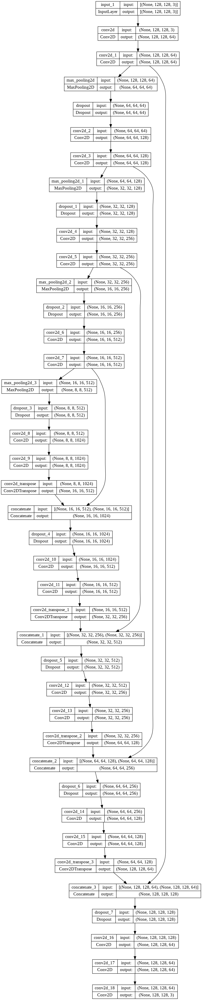

In [ ]:
tf.keras.utils.plot_model(unet_model, show_shapes=True) # Visualize the model layer connections

## Defining dice loss coefficient

In [ ]:
def dice_coeff(y_true, y_pred):
    smooth = 0.1 # Term added to both the numerator and denominator to handle the cases when the denominator tends to zero
    # Flatten
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f) # Calculate the common area
    score = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

In [ ]:
dice_loss(masks_train[0],masks_train[1]) # Testing the dice loss coefficient

<tf.Tensor: shape=(), dtype=float32, numpy=0.72608626>

In [ ]:
dice_loss(masks_train[0],masks_train[0])

<tf.Tensor: shape=(), dtype=float32, numpy=0.0>

Hence our dice loss function works fine: it should be zero for exactly same images and close to 1 for dissimilar images.

# Q3. Train the UNet

**Compile and Train U-Net**

In [ ]:
unet_model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate = 0.01),
                   loss=tf.keras.losses.BinaryCrossentropy(),
                   metrics=[dice_loss])

In [ ]:
# Change the data type of masks since input and outputs to the model must be of the same format

masks_train = tf.cast(masks_train, dtype = tf.float32)
masks_test = tf.cast(masks_test, dtype = tf.float32)

In [ ]:
# Define no. of epochs
NUM_EPOCHS = 1000

# Create the list of images and masks used for validation
images_val = np.array(images_test[:5])
masks_val = np.array(masks_test[:5])

# Train the model and save it's history
model_history = unet_model.fit(images_train,masks_train,epochs=NUM_EPOCHS,validation_data=(images_val,masks_val))

Epoch 1/1000
1/1 [==============================] - 1s 577ms/step - loss: 0.3633 - dice_loss: 0.7056 - val_loss: 0.4277 - val_dice_loss: 0.6802
Epoch 2/1000
1/1 [==============================] - 0s 490ms/step - loss: 0.3637 - dice_loss: 0.7056 - val_loss: 0.4275 - val_dice_loss: 0.6802
Epoch 3/1000
1/1 [==============================] - 0s 497ms/step - loss: 0.3639 - dice_loss: 0.7056 - val_loss: 0.4277 - val_dice_loss: 0.6802
Epoch 4/1000
1/1 [==============================] - 0s 494ms/step - loss: 0.3635 - dice_loss: 0.7056 - val_loss: 0.4275 - val_dice_loss: 0.6802
Epoch 5/1000
1/1 [==============================] - 0s 493ms/step - loss: 0.3636 - dice_loss: 0.7056 - val_loss: 0.4276 - val_dice_loss: 0.6802
Epoch 6/1000
1/1 [==============================] - 0s 495ms/step - loss: 0.3636 - dice_loss: 0.7056 - val_loss: 0.4275 - val_dice_loss: 0.6802
Epoch 7/1000
1/1 [==============================] - 0s 494ms/step - loss: 0.3631 - dice_loss: 0.7056 - val_loss: 0.4275 - val_dice_loss:

In [ ]:
# Save the model
unet_model.save("model-v3")

We have used the binary cross entropy loss for optimizing the model since the loss wasn't being updated while using the `dice_loss` function directly in the loss. Therefore we decided to just add it to the model metrics. 

In [ ]:
print(model_history.history.keys())

dict_keys(['loss', 'dice_loss', 'val_loss', 'val_dice_loss'])


## Learning curve from model history

In [ ]:
def display_learning_curves(history):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]

    epochs_range = range(NUM_EPOCHS)

    fig = plt.figure(figsize=(12,6))

    plt.plot(epochs_range, loss, label="train loss")
    plt.plot(epochs_range, val_loss, label="validataion loss")
    plt.title("Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend(loc="upper right")

    fig.tight_layout()
    plt.show()

Initially trained the model with learning rate = 0.1 for 100 epochs.

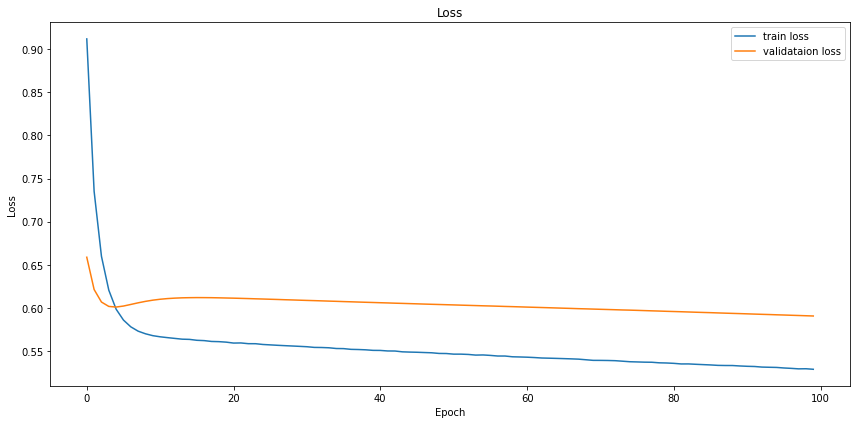

In [ ]:
# Display learning curves 
display_learning_curves(unet_model.history)

Then trained the model with learning rate = 0.01

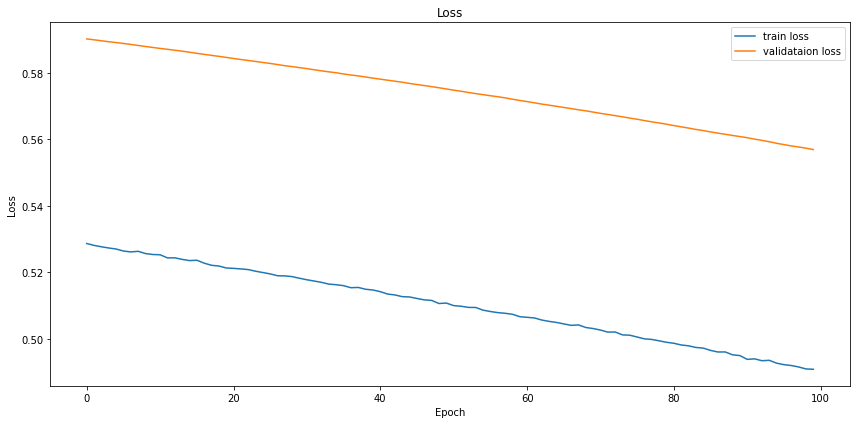

In [ ]:
display_learning_curves(unet_model.history)

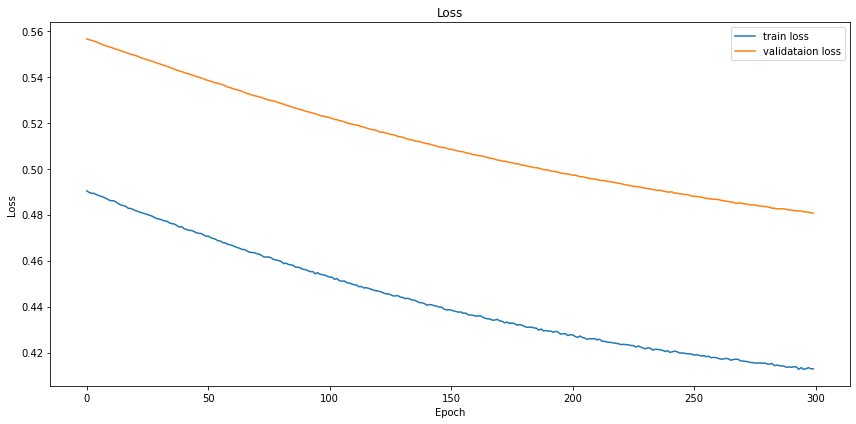

In [ ]:
display_learning_curves(unet_model.history)

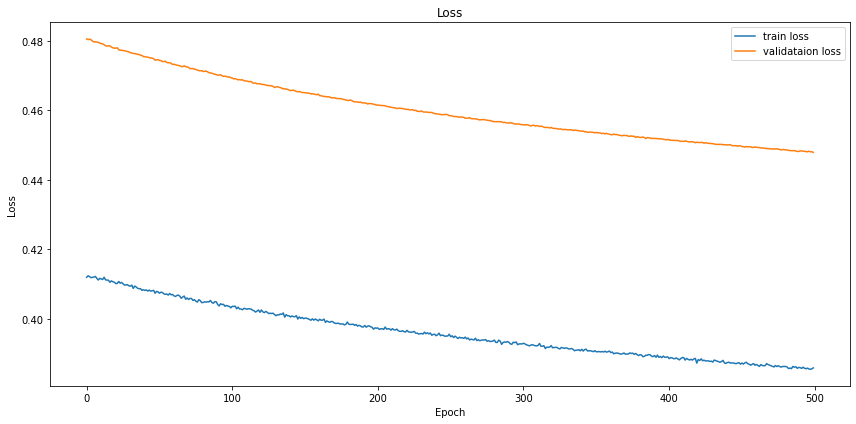

In [ ]:
display_learning_curves(unet_model.history)

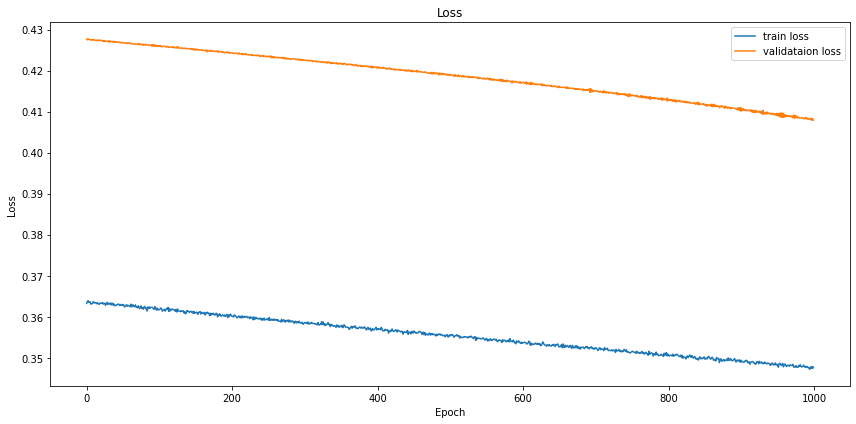

In [ ]:
display_learning_curves(unet_model.history)

It seems the model has now reached saturation.

## Q4. Show a few of the ouptut maps
Let's try the trained U-Net model on a few samples from the test dataset.

In [ ]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [ ]:
# Function to threshold the masks

def thresh_masks(mask):
  for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
      for k in range(mask.shape[2]):
        if mask[i][j][k] < 0.75: mask[i][j][k] = 0
        else: mask[i][j][k] = 1
  return mask

In [ ]:
def show_predictions(images,masks, num=1):
  preds = unet_model.predict(images)
  for i in range(len(images)):
    image = images[i]
    pred_mask = preds[i]
    pred_mask = pred_mask/pred_mask.max()
    pred_mask = thresh_masks(pred_mask)
    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(10)
    plt.subplot(1,3,1)
    plt.imshow(images[i])
    plt.title("Original image")
    plt.subplot(1,3,2)
    plt.imshow(pred_mask[:,:,0], cmap ="gray" ,vmin = 0, vmax = 1)
    plt.title("Predicted mask")
    plt.subplot(1,3,3)
    plt.imshow(masks[i], vmin =  0, vmax = 1)
    print("Dice score: ", dice_coeff(pred_mask,masks[i]))
    plt.title("Actual mask")
  plt.show()
  

1/1 [==============================] - 0s 21ms/step
Dice score:  tf.Tensor(0.5014873, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.24904567, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.23934357, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.17919995, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.07301497, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.4368154, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.22301419, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.27206066, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.23632991, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.14562958, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.26145276, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.1768483, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.2521474, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.0994418, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.09791986, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.18772149, shape=(), dtype=fl

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Dice score:  tf.Tensor(0.24881576, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.29975072, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.17497279, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.2589439, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.2635071, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.15911284, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.15898594, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.32318574, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.13409232, shape=(), dtype=float32)
Dice score:  tf.Tensor(0.13086595, shape=(), dtype=float32)


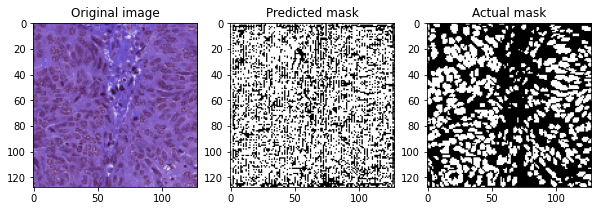

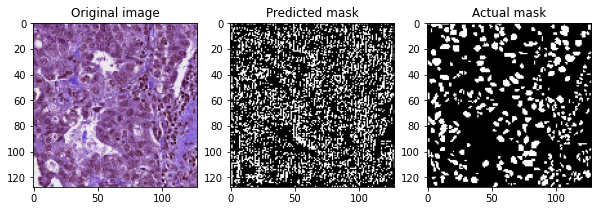

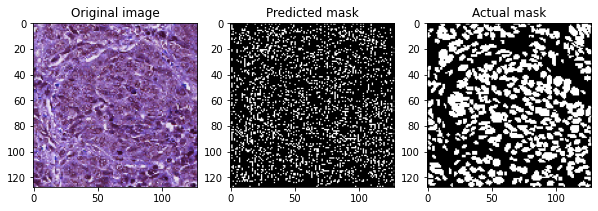

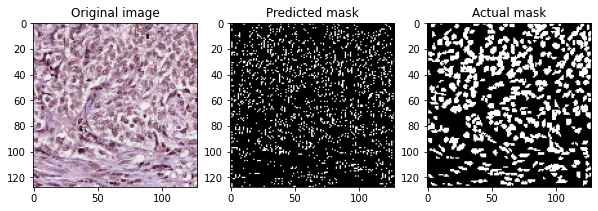

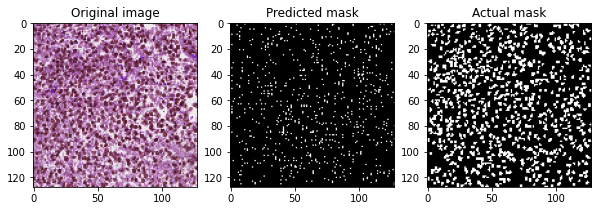

...

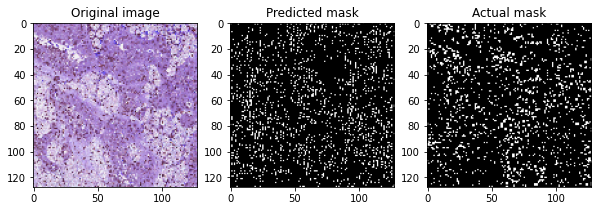

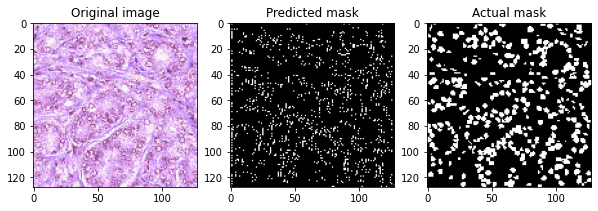

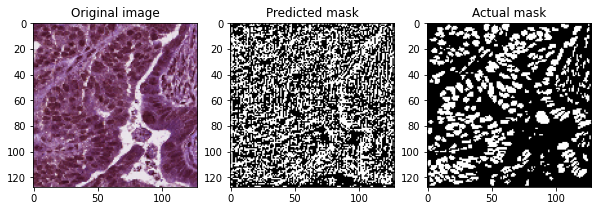

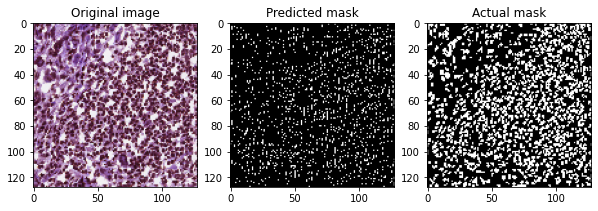

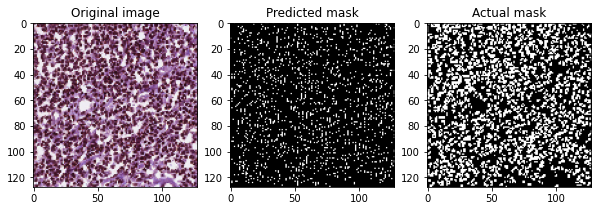

In [ ]:
show_predictions(images_train,masks_train)

## Q5.Modify the model parameters of the model

A) Increase the no. of blocks in the unet

In [ ]:
def build_unet_model2():

    # inputs
    inputs = layers.Input(shape=(128,128,3))

    # encoder: contracting path - downsample
    # 1 - downsample
    f1, p1 = downsample_block(inputs, 64)
    # 2 - downsample
    f2, p2 = downsample_block(p1, 128)
    # 3 - downsample
    f3, p3 = downsample_block(p2, 256)
    # 4 - downsample
    f4, p4 = downsample_block(p3, 512)

    # One more downsampling layer
    f5, p5 = downsample_block(p4, 1024)

    # 5 - bottleneck
    bottleneck = double_conv_block(p5, 2048)

    # Upscaling layer
    u5 = upsample_block(bottleneck, f5, 1024)

    # decoder: expanding path - upsample
    # 6 - upsample
    u6 = upsample_block(u5, f4, 512)
    # 7 - upsample
    u7 = upsample_block(u6, f3, 256)
    # 8 - upsample
    u8 = upsample_block(u7, f2, 128)
    # 9 - upsample
    u9 = upsample_block(u8, f1, 64)

    # outputs
    outputs = layers.Conv2D(3, 1, padding="same", activation = "softmax")(u9)

    # unet model with Keras Functional API
    unet_model = tf.keras.Model(inputs, outputs, name="U-Net")

    return unet_model

In [ ]:
unet_model2 = build_unet_model2()

In [ ]:
unet_model2.compile(optimizer=tf.keras.optimizers.SGD(learning_rate = 0.01),
                   loss=tf.keras.losses.BinaryCrossentropy(),
                   metrics=[dice_loss])

In [ ]:
NUM_EPOCHS = 100

images_val = np.array(images_test[:5])
masks_val = np.array(masks_test[:5])

model2_history = unet_model2.fit(images_train,masks_train,epochs=NUM_EPOCHS,validation_data=(images_val,masks_val))

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4325 - dice_loss: 0.7056 - val_loss: 0.4516 - val_dice_loss: 0.6802
Epoch 2/100
1/1 [==============================] - 1s 719ms/step - loss: 0.4260 - dice_loss: 0.7056 - val_loss: 0.4524 - val_dice_loss: 0.6802
Epoch 3/100
1/1 [==============================] - 1s 726ms/step - loss: 0.4217 - dice_loss: 0.7056 - val_loss: 0.4538 - val_dice_loss: 0.6802
Epoch 4/100
1/1 [==============================] - 1s 722ms/step - loss: 0.4184 - dice_loss: 0.7056 - val_loss: 0.4555 - val_dice_loss: 0.6802
Epoch 5/100
1/1 [==============================] - 1s 719ms/step - loss: 0.4165 - dice_loss: 0.7056 - val_loss: 0.4572 - val_dice_loss: 0.6802
Epoch 6/100
1/1 [==============================] - 1s 720ms/step - loss: 0.4152 - dice_loss: 0.7056 - val_loss: 0.4587 - val_dice_loss: 0.6802
Epoch 7/100
1/1 [==============================] - 1s 725ms/step - loss: 0.4139 - dice_loss: 0.7056 - val_loss: 0.4602 - val_dice_loss: 0.6802
Ep

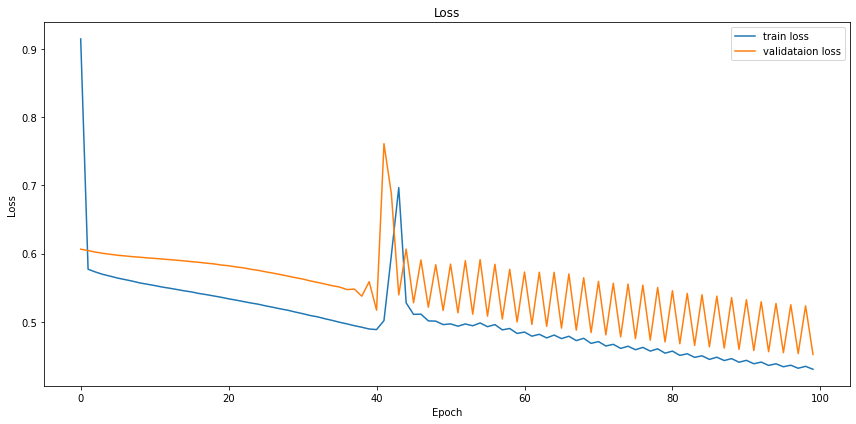

In [ ]:
display_learning_curves(model2_history)

Train the model with learning rate 0.01 for the next 100 epochs

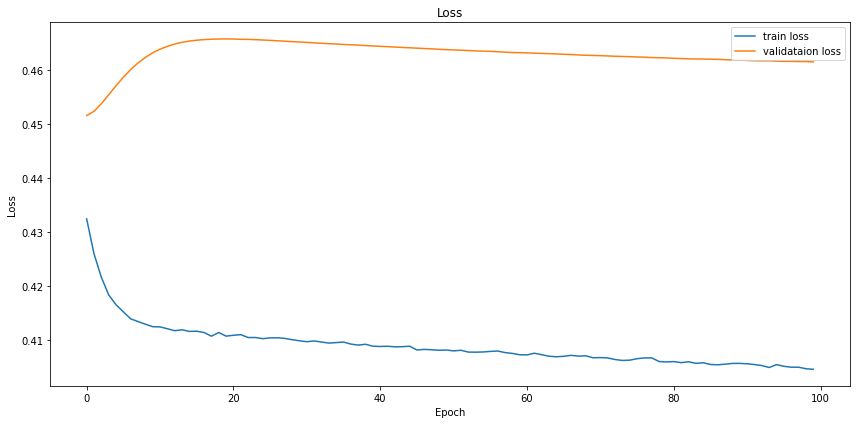

In [ ]:
display_learning_curves(model2_history)

It seems increasing the no. of blocks doesn't have much of an impact.

B. Increasing the no. of filters per layer.

In [ ]:
def build_unet_model3():

    # inputs
    inputs = layers.Input(shape=(128,128,3))

    # encoder: contracting path - downsample
    # 1 - downsample
    f1, p1 = downsample_block(inputs, 128)
    # 2 - downsample
    f2, p2 = downsample_block(p1, 256)
    # 3 - downsample
    f3, p3 = downsample_block(p2, 512)
    # 4 - downsample
    f4, p4 = downsample_block(p3, 1024)

    # 5 - bottleneck
    bottleneck = double_conv_block(p4, 2048)

    # decoder: expanding path - upsample
    # 6 - upsample
    u6 = upsample_block(bottleneck, f4, 1024)
    # 7 - upsample
    u7 = upsample_block(u6, f3, 512)
    # 8 - upsample
    u8 = upsample_block(u7, f2, 256)
    # 9 - upsample
    u9 = upsample_block(u8, f1, 128)

    # outputs
    outputs = layers.Conv2D(3, 1, padding="same", activation = "softmax")(u9)

    # unet model with Keras Functional API
    unet_model = tf.keras.Model(inputs, outputs, name="U-Net")

    return unet_model

In [ ]:
unet_model3 = build_unet_model3()

In [ ]:
unet_model3.compile(optimizer=tf.keras.optimizers.SGD(learning_rate = 0.01),
                   loss=tf.keras.losses.BinaryCrossentropy(),
                   metrics=[dice_loss])

In [ ]:
NUM_EPOCHS = 100

images_val = np.array(images_test[:5])
masks_val = np.array(masks_test[:5])

model3_history = unet_model3.fit(images_train,masks_train,epochs=NUM_EPOCHS,validation_data=(images_val,masks_val))

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4101 - dice_loss: 0.7056 - val_loss: 0.4351 - val_dice_loss: 0.6802
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 0.4043 - dice_loss: 0.7056 - val_loss: 0.4346 - val_dice_loss: 0.6802
Epoch 3/100
1/1 [==============================] - 1s 1s/step - loss: 0.3995 - dice_loss: 0.7056 - val_loss: 0.4349 - val_dice_loss: 0.6802
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.3965 - dice_loss: 0.7056 - val_loss: 0.4357 - val_dice_loss: 0.6802
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.3942 - dice_loss: 0.7056 - val_loss: 0.4367 - val_dice_loss: 0.6802
Epoch 6/100
1/1 [==============================] - 1s 1s/step - loss: 0.3926 - dice_loss: 0.7056 - val_loss: 0.4378 - val_dice_loss: 0.6802
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.3914 - dice_loss: 0.7056 - val_loss: 0.4389 - val_dice_loss: 0.6802
Epoch 8/100
1/1 [===

Learning rate 0.1 for the first 100 epochs.

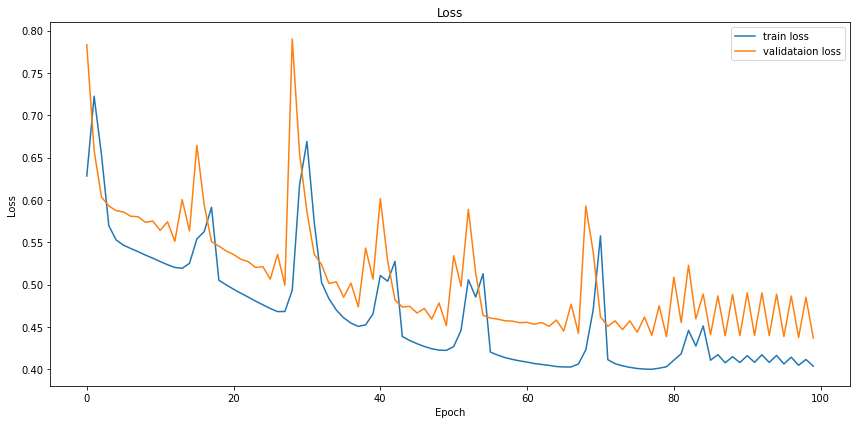

In [ ]:
display_learning_curves(model3_history)

Learning rate 0.01 for the next 100 epochs.

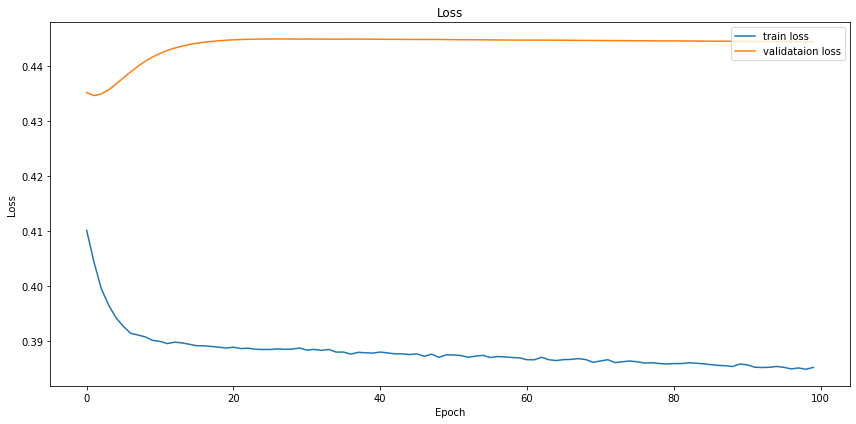

In [ ]:
display_learning_curves(model3_history)

**C) Loss function as a combination of Dice and MS-SSIM with a trade-off parameter**

In [ ]:
def build_unet_model4():

    # inputs
    inputs = layers.Input(shape=(128,128,3))

    # encoder: contracting path - downsample
    # 1 - downsample
    f1, p1 = downsample_block(inputs, 128)
    # 2 - downsample
    f2, p2 = downsample_block(p1, 256)
    # 3 - downsample
    f3, p3 = downsample_block(p2, 512)
    # 4 - downsample
    f4, p4 = downsample_block(p3, 1024)

    # 5 - bottleneck
    bottleneck = double_conv_block(p4, 2048)

    # decoder: expanding path - upsample
    # 6 - upsample
    u6 = upsample_block(bottleneck, f4, 1024)
    # 7 - upsample
    u7 = upsample_block(u6, f3, 512)
    # 8 - upsample
    u8 = upsample_block(u7, f2, 256)
    # 9 - upsample
    u9 = upsample_block(u8, f1, 128)

    # outputs
    outputs = layers.Conv2D(3, 1, padding="same", activation = "softmax")(u9)

    # unet model with Keras Functional API
    unet_model = tf.keras.Model(inputs, outputs, name="U-Net")

    return unet_model

In [ ]:
unet_model4 = build_unet_model4()

In [ ]:
def custom_loss(y_pred, y_act, x = 0.3):
  '''
  default value taken to be one
  x is the trade off parameter
  '''
  msssim = tf.image.ssim_multiscale(y_pred,y_act)
  dice_loss = dice_loss(y_pred,y_act)
  loss = x*dice_loss + (1-x)*msssim
  return loss

In [ ]:
unet_model4.compile(optimizer=tf.keras.optimizers.SGD(learning_rate = 0.01),
                   loss=custom_loss,
                   metrics=[dice_loss])

In [ ]:
model4_history = unet_model4.fit(images_train,masks_train,epochs=NUM_EPOCHS,validation_data=(images_val,masks_val))

# Q6. Watershed segmentation

In [ ]:
def rescale_intensity(mask):
  mask = np.array(mask)
  # Uncomment the line below if mask isn't rescaled to 0 to 255
  # mask = 255*mask/mask.max() # Rescale the binary mask to a scale of 0 to 255 so that we can use cv2 operations on it
  mask = np.array(mask, dtype = np.uint8)
  mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
  cv2_imshow(mask)
  return mask

In [ ]:
preds = unet_model(images_test)

In [ ]:
def watershed_segmentation(mask):
  # Source: https://docs.opencv.org/4.x/d3/db4/tutorial_py_watershed.html 
  new_mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
  ret, thresh = cv2.threshold(new_mask,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
  kernel = np.ones((3,3),np.uint8)
  # noise
  opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)
  # sure background area
  sure_bg = cv2.dilate(opening,kernel,iterations=3)
  # Finding sure foreground area
  dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
  ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
  # Finding unknown region
  sure_fg = np.uint8(sure_fg)
  unknown = cv2.subtract(sure_bg,sure_fg)
  # Marker labelling
  ret, markers = cv2.connectedComponents(sure_fg)
  # Add one to all labels so that sure background is not 0, but 1
  markers = markers+1
  # Now, mark the region of unknown with zero
  markers[unknown==255] = 0
  markers = cv2.watershed(mask,markers)
  mask[markers == -1] = [255,0,0]
  return mask, markers

In [ ]:
mask = cv2.imread("mask-0.png")

In [ ]:
new_mask, markers = watershed_segmentation(mask) 

(205, 207) <class 'numpy.ndarray'>
(205, 207, 3) <class 'numpy.ndarray'>


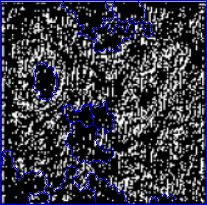

In [ ]:
cv2_imshow(mask)